# Developing a Staff Promotion Algorithm  
  The data for this project is courtesy of the Data Science Nigeria Kaggle Competition. https://www.kaggle.com/c/intercampusai2019
## By: Vincent Donkoh

In [1]:
#Importing needed Libraries
import pandas as pd
import pandas_profiling as pp
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

from sklearn.metrics import confusion_matrix, f1_score, precision_recall_curve, accuracy_score, precision_score, recall_score, roc_auc_score
from sklearn.model_selection import GridSearchCV, train_test_split,cross_val_score

import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostClassifier, Pool, cv

import warnings
warnings.filterwarnings("ignore")

# Set all options
%matplotlib inline
plt.style.use('seaborn-notebook')
plt.rcParams["figure.figsize"] = (20, 3)
pd.options.display.float_format = '{:20,.4f}'.format
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
sns.set(context="paper", font="monospace")

In [2]:
#reading csv data as pandas data frames
data = pd.read_csv('data.csv')

In [3]:
# Defining target feature: Promoted==>1 and Not_Promoted==>0
target = data["Promoted_or_Not"]
pd.DataFrame(target.value_counts())

,Promoted_or_Not
0,35071
1,3241


# Question 1
• Prepare a comprehensive exploratory data analysis (EDA) using the training dataset. The EDA should include exploring the shape of the data, checking correlation matrix, bar charts, simple and complex plots like heat map and KDE, summary statistics etc. 

In [4]:
#Getting some summary stats and and a full profile report on the data
display(pd.DataFrame(data.sample(10)),pd.DataFrame(data.describe()),pd.DataFrame(data.info()), pp.ProfileReport(data))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38312 entries, 0 to 38311
Data columns (total 17 columns):
EmployeeNo                             38312 non-null object
Division                               38312 non-null object
Qualification                          36633 non-null object
Gender                                 38312 non-null object
Channel_of_Recruitment                 38312 non-null object
Trainings_Attended                     38312 non-null int64
Year_of_birth                          38312 non-null int64
Last_performance_score                 38312 non-null float64
Year_of_recruitment                    38312 non-null int64
Targets_met                            38312 non-null int64
Previous_Award                         38312 non-null int64
Training_score_average                 38312 non-null int64
Foreign_schooled                       38312 non-null object
Past_Disciplinary_Action               38312 non-null object
Previous_IntraDepartmental_Movement    383

,EmployeeNo,Division,Qualification,Gender,Channel_of_Recruitment,Trainings_Attended,Year_of_birth,Last_performance_score,Year_of_recruitment,Targets_met,Previous_Award,Training_score_average,Foreign_schooled,Past_Disciplinary_Action,Previous_IntraDepartmental_Movement,No_of_previous_employers,Promoted_or_Not
650,YAK/S/00919,Commercial Sales and Marketing,First Degree or HND,Male,Agency and others,2,1981,2.5000,2009,0,0,40,No,No,No,0,0
24880,YAK/S/35488,Business Finance Operations,First Degree or HND,Female,Agency and others,2,1974,2.5000,2005,0,0,49,Yes,No,No,1,0
31720,YAK/S/45285,Commercial Sales and Marketing,First Degree or HND,Female,Agency and others,2,1994,7.5000,2015,1,0,40,Yes,No,No,1,0
7251,YAK/S/10264,Customer Support and Field Operations,First Degree or HND,Female,Agency and others,2,1996,0.0000,2018,1,0,54,Yes,No,No,0,0
35527,YAK/S/50750,Customer Support and Field Operations,First Degree or HND,Female,Direct Internal process,4,1997,7.5000,2018,0,0,51,Yes,No,No,1,0
28824,YAK/S/41150,Sourcing and Purchasing,First Degree or HND,Female,Agency and others,2,1992,7.5000,2015,0,0,66,Yes,No,No,1,0
1470,YAK/S/02034,Information Technology and Solution Support,First Degree or HND,Male,Agency and others,2,1995,0.0000,2018,1,0,70,Yes,No,No,1,0
29551,YAK/S/42157,Information Technology and Solution Support,First Degree or HND,Male,Direct Internal process,4,1991,2.5000,2014,0,0,74,Yes,No,No,1,0
31960,YAK/S/45613,Sourcing and Purchasing,First Degree or HND,Male,Direct Internal process,2,1979,7.5000,2016,1,0,60,Yes,No,No,1,0
25163,YAK/S/35903,Customer Support and Field Operations,"MSc, MBA and PhD",Female,Agency and others,3,1985,7.5000,2016,1,0,50,Yes,No,No,0,0


,Trainings_Attended,Year_of_birth,Last_performance_score,Year_of_recruitment,Targets_met,Previous_Award,Training_score_average,Promoted_or_Not
count,"38,312.0000","38,312.0000","38,312.0000","38,312.0000","38,312.0000","38,312.0000","38,312.0000","38,312.0000"
mean,2.2537,"1,986.2093",7.6990,"2,013.1397",0.3530,0.0232,55.3665,0.0846
std,0.6094,7.6460,3.7441,4.2615,0.4779,0.1504,13.3627,0.2783
min,2.0000,"1,950.0000",0.0000,"1,982.0000",0.0000,0.0000,31.0000,0.0000
25%,2.0000,"1,982.0000",5.0000,"2,012.0000",0.0000,0.0000,43.0000,0.0000
50%,2.0000,"1,988.0000",7.5000,"2,014.0000",0.0000,0.0000,52.0000,0.0000
75%,2.0000,"1,992.0000",10.0000,"2,016.0000",1.0000,0.0000,68.0000,0.0000
max,11.0000,"2,001.0000",12.5000,"2,018.0000",1.0000,1.0000,91.0000,1.0000


""


In [4]:
print("Shape of Data = ",data.shape)

Shape of Data =  (38312, 17)


The profile report of the data shows 17 variables as well as information on the variable types for 38312 observations of which 0.3%(1679) is missing  
The missing values forms (4.4%) of the data for the field 'Qualificaton'  
There are 2905 zeros forming 7.6% of the data for the field 'Last_performance_score'  
The shape of the data is confirmed by the information from the profile report

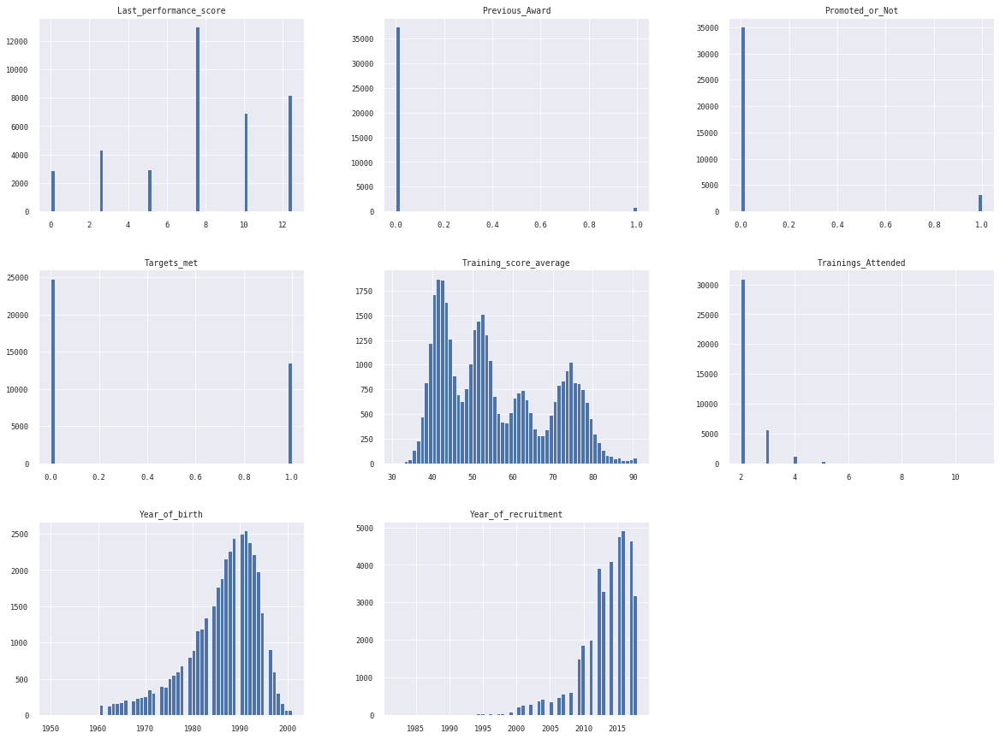

In [6]:
#Visualizing the Distribution across cateorical features
data.hist(bins = 60, figsize = (20, 15))
plt.show()

In [7]:
#Displaying the attributes
pd.DataFrame(data.columns)

,0
0,EmployeeNo
1,Division
2,Qualification
3,Gender
4,Channel_of_Recruitment
5,Trainings_Attended
6,Year_of_birth
7,Last_performance_score
8,Year_of_recruitment
9,Targets_met


In [4]:
#Defined Functions to be used
def data_quality_report(df):

    """
    Author: Vincent
    Description: Displays quality of data in terms of total missing values, percentage of missing values, number unique observations and datatypes.
    Arguments: Dataframe
    """
    dtype = df.dtypes
    uniqn = df.T.apply(lambda x: x.nunique(), axis=1)
    total = df.isnull().sum().sort_values(ascending = False)
    percent = (df.isnull().sum()/df.isnull().count()*100).sort_values(ascending = False)
    data_quality  = pd.concat([total, percent, uniqn, dtype], axis=1, keys=['Total', 'Percent','No_unique', 'Dtype'])
    display(data_quality)
    

    


def encode_cat_features(d_convert):
    import category_encoders as ce
    
    """
    Author: Vincent
    Description: returns Dataframe with all categorical variables converted into dummies
    Arguments: Dataframe (having categorical variables)
    """
    
    
    mapping={'MSc, MBA and PhD':1, 'First Degree or HND':2,'Non-University Education':3,'unknown':4}
    d_convert['Qualification'] = d_convert['Qualification'].apply(lambda x : mapping[x])
    encoder = ce.OrdinalEncoder(cols=['cat_Years_in_company','cat_Age','cat_Training_score_average'])
    encoder.fit(d_convert)
    d_convert = encoder.transform(d_convert)



    df = d_convert.copy()
    list_to_drop = []
    for col in df.columns:
        if df[col].dtype == 'object':
            list_to_drop.append(col)
            df = pd.concat([df,pd.get_dummies(df[col],prefix=col,prefix_sep='_', drop_first=False)], axis=1)    
    df = df.drop(list_to_drop,axis=1)
    return df


def object_count_plot(df):

    """
    Author: Vincents
    Description : Plot countplot for all the objects present in the dataframe passed
    Argument : Dataframe
    """
    
    for var in df.columns:
        if df[var].dtype == 'object':
            print(df[var].value_counts())
            plt.figure(figsize=(12,5))
            g = sns.countplot(x=var,data=df)
            g.set_xticklabels(g.get_xticklabels(), rotation=90, ha="right")
            plt.tight_layout()
            plt.show()
            
            
def plots(feild):
    """
    Author: Vincent
    Description:Bar, Box plots and Pie charts of the features
    Arguments: String. (A feature of the data set)
    
    """
    print(feild)
    plt.figure(figsize=(25,15)) 
    plt.subplot(2, 3, 1)
    data[feild].value_counts().plot('bar',color=(0.2, 0.4, 0.6, 0.6))
    plt.subplot(2, 3, 2)
    chart=sns.barplot(data[feild], target)
    chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
    d=data[feild].value_counts()
    plt.subplot(2, 3, 3)
    plt.pie(d,labels=d.index,autopct='%1.2f%%')
    #plt.subplot(2, 3, 4)
    #box_age=sns.boxplot(data=data[feild])
    plt.show()

    
def analysis_tab(data_pro_cop):
    """
    Author: Vincent
    Description: Tabulates the number promoted or not and their percentages
    Arguments: Dataframe
    
    """
    data = data_pro_cop.copy()
    #data.drop('EmployeeNo',axis=1)
    for col in data.drop('Promoted_or_Not',axis=1).columns:
        if data[col].dtype == 'object' or data[col].nunique() < 10:
            xx = data.groupby(col)['Promoted_or_Not'].value_counts().unstack(1)
            per_not_promoted = xx.iloc[:, 0] *100/xx.apply(lambda x: x.sum(), axis=1)
            per_promoted = xx.iloc[:, 1]*100/xx.apply(lambda x: x.sum(), axis=1)
            xx['%_0'] = per_not_promoted
            xx['%_1'] = per_promoted
            display(xx)
            print('---------------------------------------------------------------')
            print('---------------------------------------------------------------')
    

def plot_2d_space(X, y, label='Classes'): 
    """
    Author: Vincent
    Description: create a 2-dimensional plot function, plot_2d_space, to see the data distribution:
    Arguments: X: DataFrame, y: Series, label='Classes'
    
    """
    colors = ['#1F77B4', '#FF7F0E']
    markers = ['o', 's']
    for l, c, m in zip(np.unique(y), colors, markers):
        plt.scatter(
            X[y==l, 0],
            X[y==l, 1],
            c=c, label=l, marker=m
        )
    plt.title(label)
    plt.legend(loc='upper right')
    plt.show()    
    
    
    
def data_prepro(df):
    df['Qualification'].fillna('unknown', inplace = True)
    return df

In [5]:
# On missing data.
# Checking for the quality of the data by total number of missing data and theri percentages. These details are also provided in the profile report.
data_quality_report(data)

,Total,Percent,No_unique,Dtype
Channel_of_Recruitment,0,0.0000,3,object
Division,0,0.0000,9,object
EmployeeNo,0,0.0000,38312,object
Foreign_schooled,0,0.0000,2,object
Gender,0,0.0000,2,object
Last_performance_score,0,0.0000,6,float64
No_of_previous_employers,0,0.0000,7,object
Past_Disciplinary_Action,0,0.0000,2,object
Previous_Award,0,0.0000,2,int64
Previous_IntraDepartmental_Movement,0,0.0000,2,object


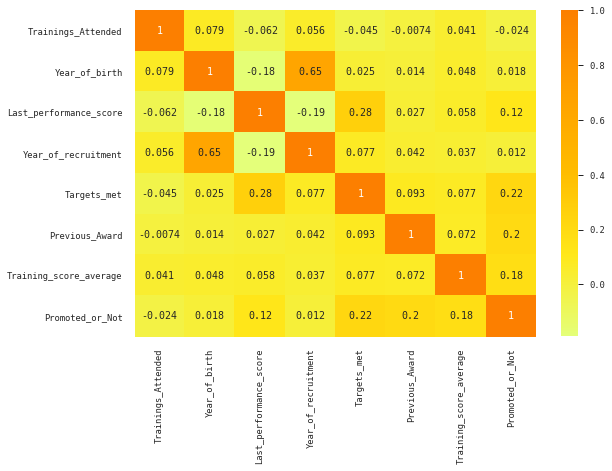

In [10]:
plt.figure(figsize=(9,6))
sns.heatmap(data.corr(),cmap='Wistia',annot=True)

Index(['Trainings_Attended', 'Year_of_birth', 'Last_performance_score',
       'Year_of_recruitment', 'Targets_met', 'Previous_Award',
       'Training_score_average', 'Promoted_or_Not'],
      dtype='object')


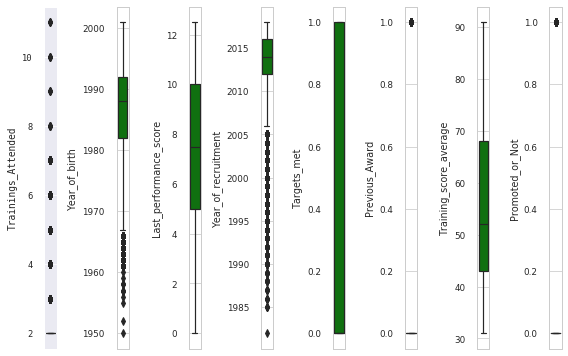

In [11]:
l = data.select_dtypes(include=[np.number]).columns
print(l)
number_of_columns= len(l)
number_of_rows = len(l)-1/number_of_columns
plt.figure(figsize=(number_of_columns,5*number_of_rows))
for i in range(0,len(l)):
    plt.subplot(number_of_rows + 1,number_of_columns,i+1)
    sns.set_style('whitegrid')
    sns.boxplot(data[l[i]],color='green',orient='v')
    plt.tight_layout()


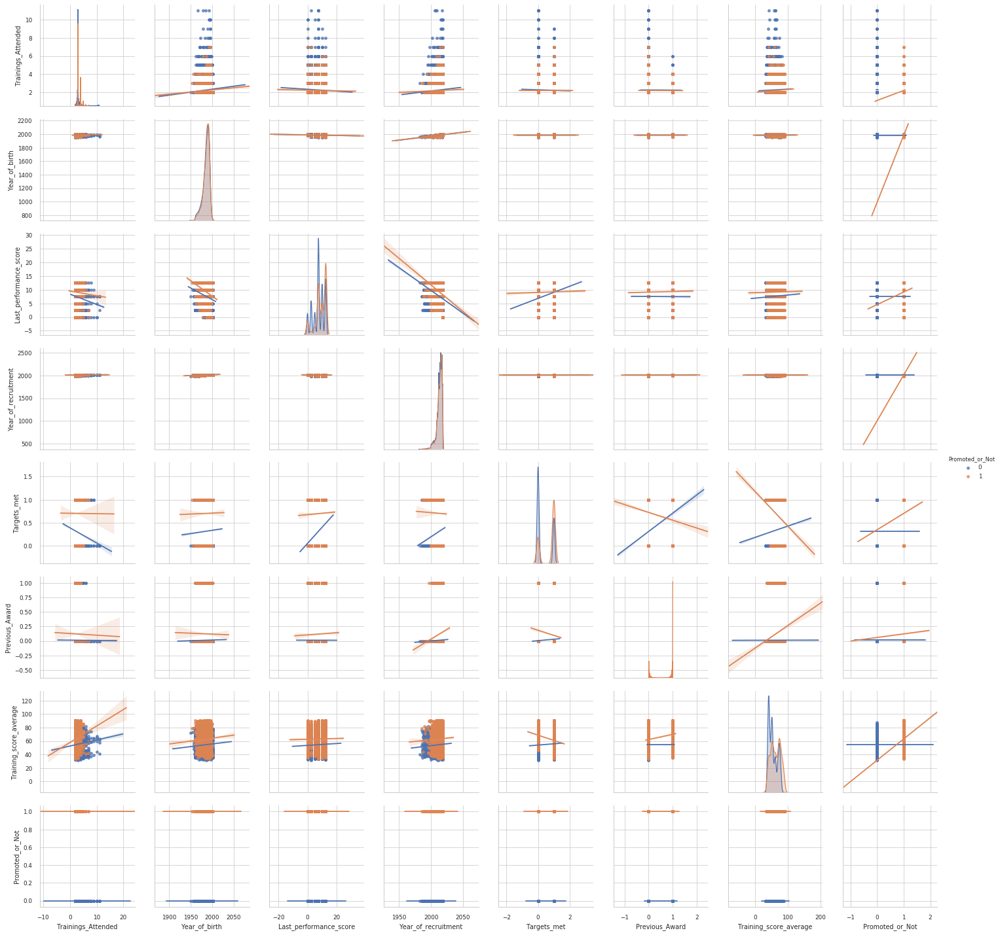

In [12]:
sns.pairplot(data[l], hue = 'Promoted_or_Not', kind = 'reg')

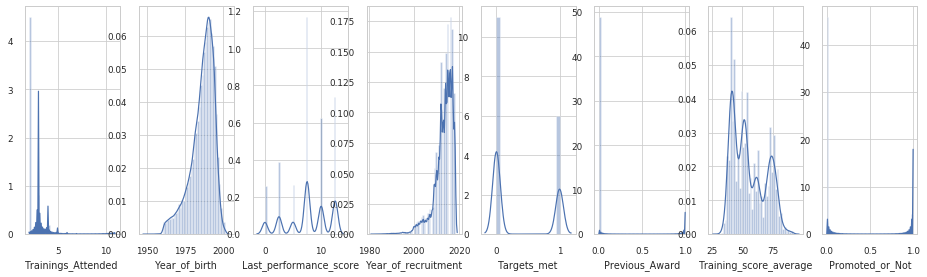

In [13]:
plt.figure(figsize=(2*number_of_columns,5*number_of_rows))
for i in range(0,len(l)):
    plt.subplot(number_of_rows + 1,number_of_columns,i+1)
    sns.distplot(data[l[i]],kde=True)

## Bar plots and Pie charts for features againt the target feature

Division


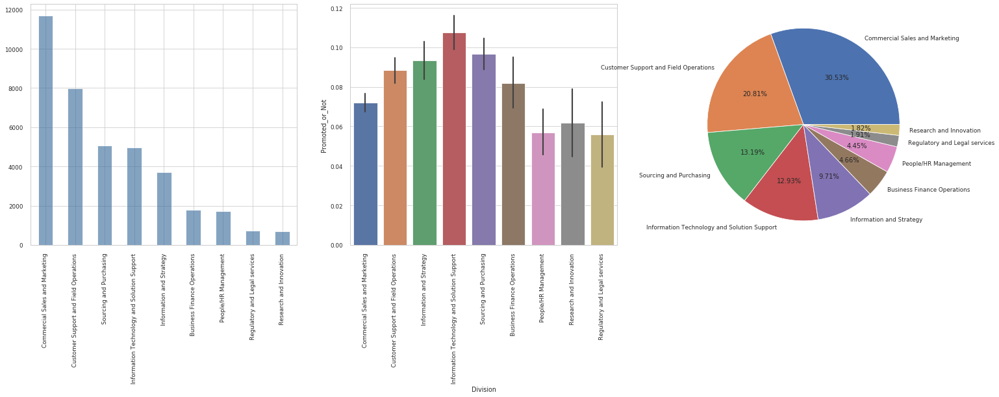

Qualification


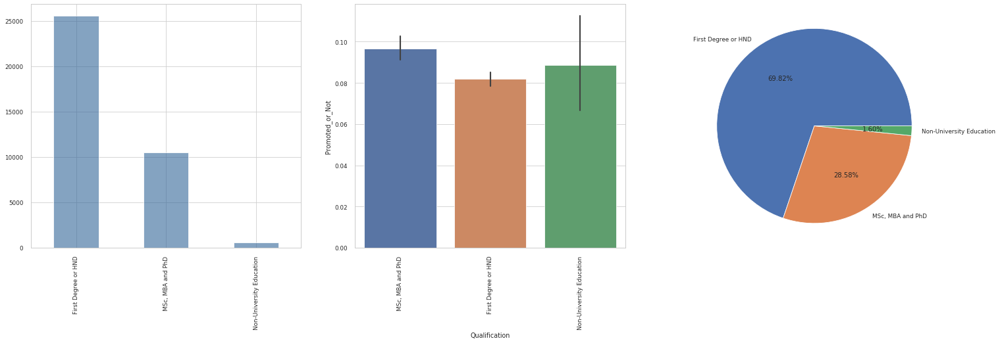

Gender


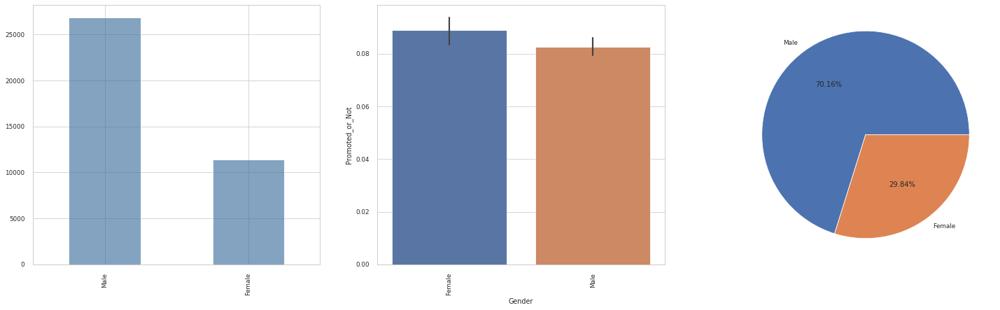

Channel_of_Recruitment


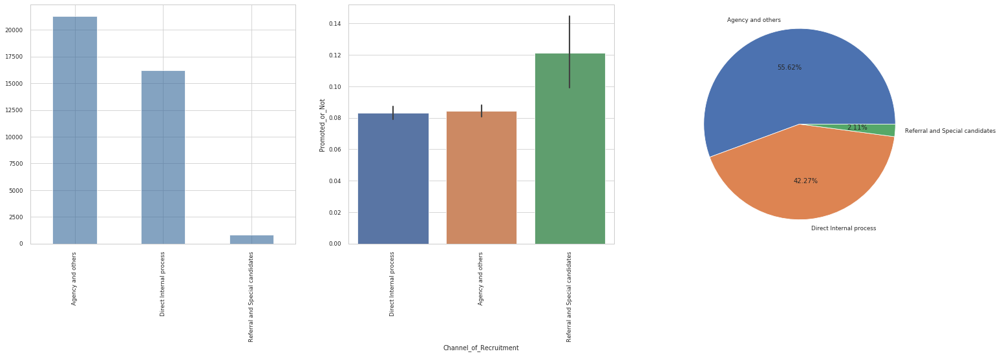

Trainings_Attended


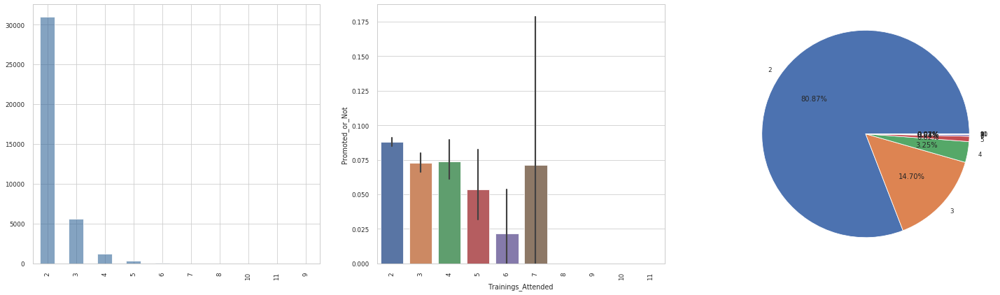

Year_of_birth


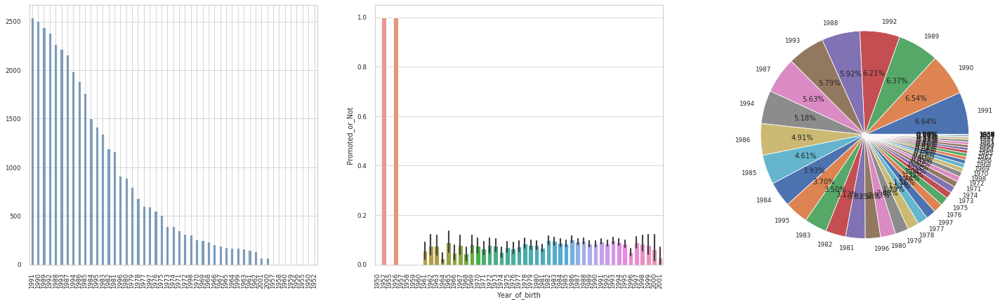

Last_performance_score


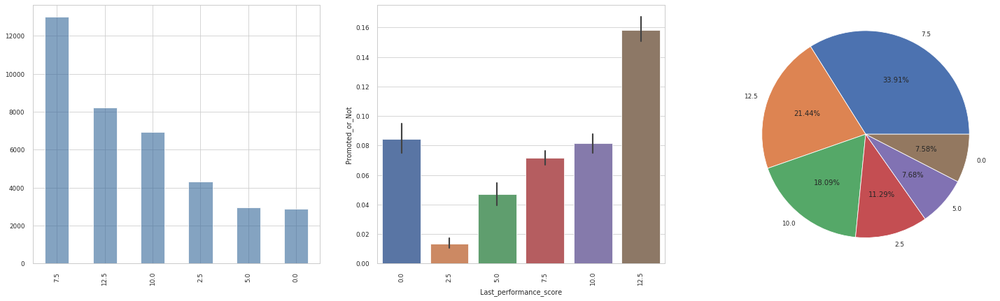

Year_of_recruitment


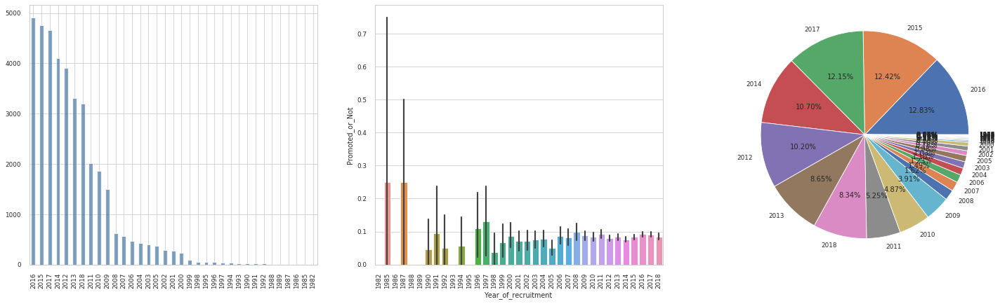

Targets_met


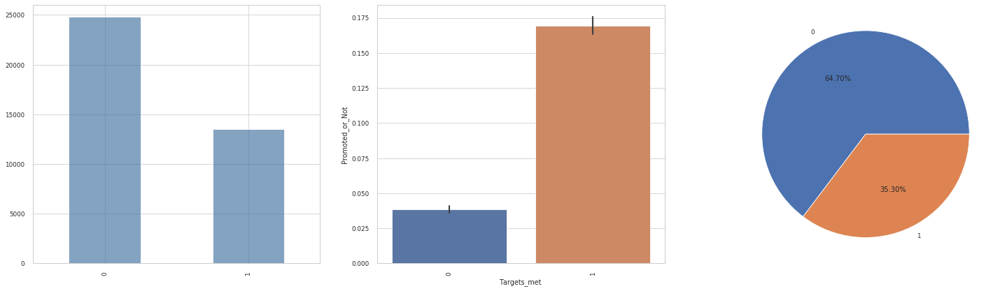

Previous_Award


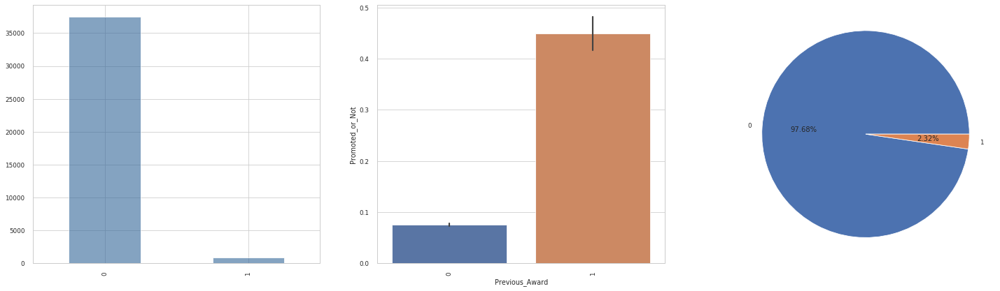

Training_score_average


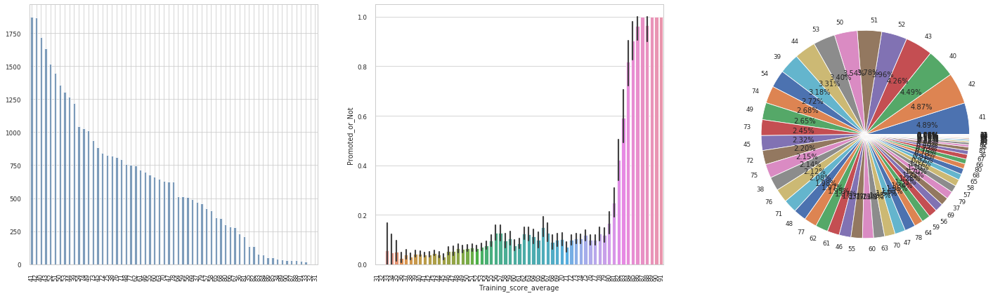

Foreign_schooled


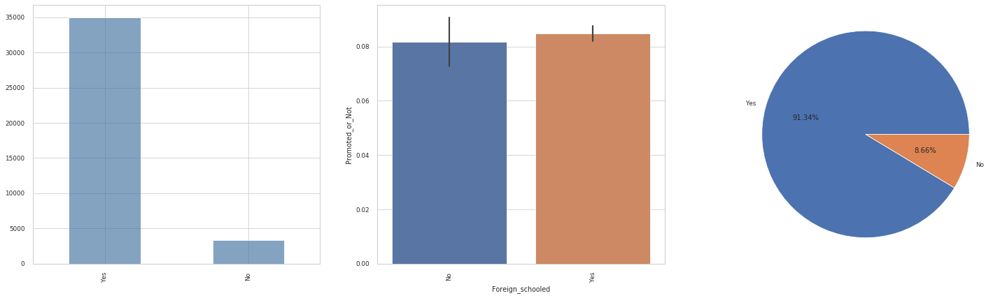

Past_Disciplinary_Action


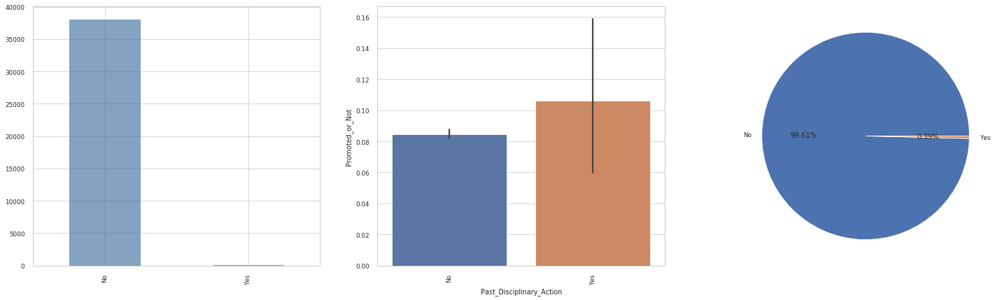

Previous_IntraDepartmental_Movement


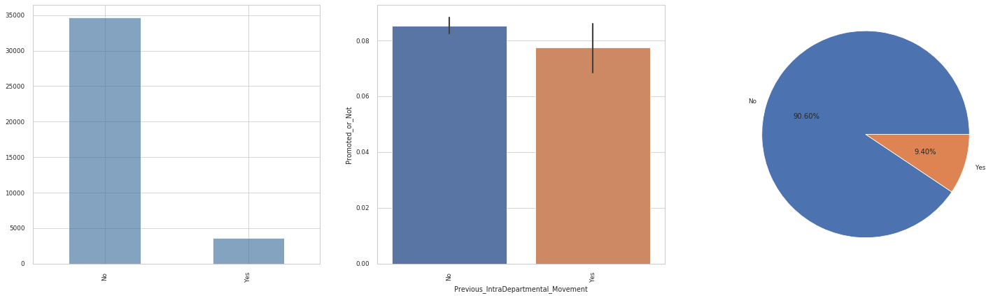

No_of_previous_employers


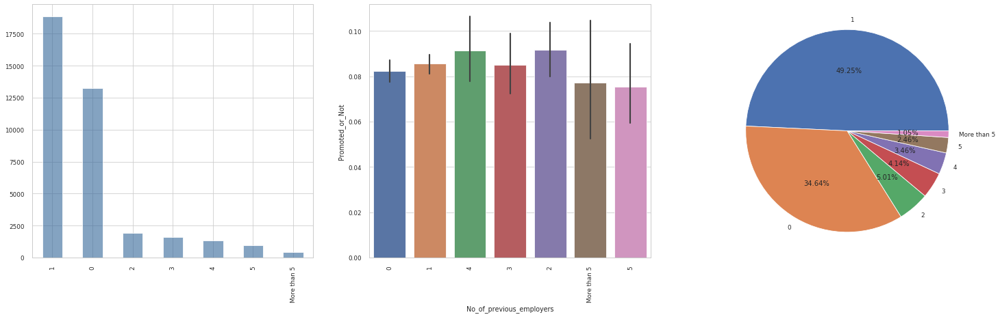

Promoted_or_Not


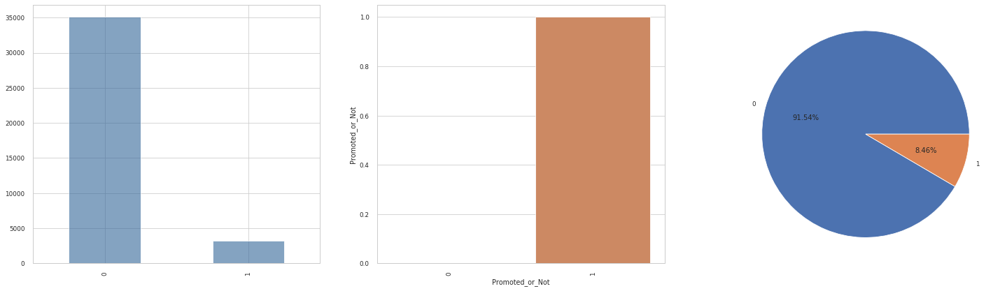

In [14]:
for i in data.columns:
    if i != 'EmployeeNo':
        plots(i)
# If very needful for explanatoin, add stack-bar plots to show number of promoted or not for each option(bar)        

### From the analysis, we see the following   
- Promotions are most likely in the Information Technology and Solution Support Departments and least likely in Regulatory and Legal Services. Meanwhile, the 'Sales and Marketing' department has the maximum number of employees.
- Post-graduate degree holders(MSc, MBA and PhD) are most likely to be promoted even though they do not form majority of the population. Whiles those with unknown       qualifications are least likey to gain promotion.
- Referrals and Special candidates are far more likely to be promoted than people who were recruited via other means
- Employees who met their annual target are most likely to be promoted
- Employees who have previously been awarded are far more likely to be promoted
- Gender, Last performance score, Place of schooling, etc have very little or no role to play in the promotion of employees

## Corresponding Numerical representation of the Analysis on the different categories in the features with respect to target feature.


In [6]:
data_cop = data.copy()
data_pro_cop=data_cop.drop('EmployeeNo',axis=1)
analysis_tab(data_pro_cop)

Promoted_or_Not,0,1,%_0,%_1
Division,,,,
Business Finance Operations,1640,146,91.8253,8.1747
Commercial Sales and Marketing,10854,841,92.8089,7.1911
Customer Support and Field Operations,7269,704,91.1702,8.8298
Information Technology and Solution Support,4420,532,89.2569,10.7431
Information and Strategy,3373,348,90.6477,9.3523
People/HR Management,1607,97,94.3075,5.6925
Regulatory and Legal services,692,41,94.4065,5.5935
Research and Innovation,653,43,93.8218,6.1782
Sourcing and Purchasing,4563,489,90.3207,9.6793


---------------------------------------------------------------
---------------------------------------------------------------


Promoted_or_Not,0,1,%_0,%_1
Qualification,,,,
First Degree or HND,23483,2095,91.8094,8.1906
"MSc, MBA and PhD",9457,1012,90.3334,9.6666
Non-University Education,534,52,91.1263,8.8737


---------------------------------------------------------------
---------------------------------------------------------------


Promoted_or_Not,0,1,%_0,%_1
Gender,,,,
Female,10414,1018,91.0952,8.9048
Male,24657,2223,91.7299,8.2701


---------------------------------------------------------------
---------------------------------------------------------------


Promoted_or_Not,0,1,%_0,%_1
Channel_of_Recruitment,,,,
Agency and others,19514,1796,91.5720,8.4280
Direct Internal process,14847,1347,91.6821,8.3179
Referral and Special candidates,710,98,87.8713,12.1287


---------------------------------------------------------------
---------------------------------------------------------------


Promoted_or_Not,0,1,%_0,%_1
Last_performance_score,,,,
0.0000,2659,246,91.5318,8.4682
2.5000,4266,59,98.6358,1.3642
5.0000,2806,138,95.3125,4.6875
7.5000,12059,934,92.8115,7.1885
10.0000,6367,565,91.8494,8.1506
12.5000,6914,1299,84.1836,15.8164


---------------------------------------------------------------
---------------------------------------------------------------


Promoted_or_Not,0,1,%_0,%_1
Targets_met,,,,
0,23835,953,96.1554,3.8446
1,11236,2288,83.0819,16.9181


---------------------------------------------------------------
---------------------------------------------------------------


Promoted_or_Not,0,1,%_0,%_1
Previous_Award,,,,
0,34582,2843,92.4035,7.5965
1,489,398,55.1297,44.8703


---------------------------------------------------------------
---------------------------------------------------------------


Promoted_or_Not,0,1,%_0,%_1
Foreign_schooled,,,,
No,3046,271,91.8300,8.1700
Yes,32025,2970,91.5131,8.4869


---------------------------------------------------------------
---------------------------------------------------------------


Promoted_or_Not,0,1,%_0,%_1
Past_Disciplinary_Action,,,,
No,34936,3225,91.5490,8.4510
Yes,135,16,89.4040,10.5960


---------------------------------------------------------------
---------------------------------------------------------------


Promoted_or_Not,0,1,%_0,%_1
Previous_IntraDepartmental_Movement,,,,
No,31747,2962,91.4662,8.5338
Yes,3324,279,92.2565,7.7435


---------------------------------------------------------------
---------------------------------------------------------------


Promoted_or_Not,0,1,%_0,%_1
No_of_previous_employers,,,,
0,12179,1093,91.7646,8.2354
1,17253,1614,91.4454,8.5546
2,1742,176,90.8238,9.1762
3,1452,135,91.4934,8.5066
4,1203,121,90.8610,9.1390
5,872,71,92.4708,7.5292
More than 5,370,31,92.2693,7.7307


---------------------------------------------------------------
---------------------------------------------------------------


# Question 2
• What new features did you engineer with the data?    
• Explain the different steps used to engineer and encode the following features: categorical and numerical variables?     
• Are there missing values in the data? If yes, how did you impute them?

## On the missing data

0.3%(1679) of the data is missing all from the feature 'Qualification' forming 4.4% of the data in that field.  
The proportion of the missing data as compared to the overall data is very small and could be removed without it posing any issue,  
but I prefere to replace the missing Qualifications as 'unknown' in attempt to conserve the data as much as possible.

In [7]:
data_to_pro = data.copy()
data_pro = data_prepro(data_to_pro)
data_quality_report(data_pro)
print('So there is no missing data now')

,Total,Percent,No_unique,Dtype
Channel_of_Recruitment,0,0.0000,3,object
Division,0,0.0000,9,object
EmployeeNo,0,0.0000,38312,object
Foreign_schooled,0,0.0000,2,object
Gender,0,0.0000,2,object
Last_performance_score,0,0.0000,6,float64
No_of_previous_employers,0,0.0000,7,object
Past_Disciplinary_Action,0,0.0000,2,object
Previous_Award,0,0.0000,2,int64
Previous_IntraDepartmental_Movement,0,0.0000,2,object


So there is no missing data now


## On Feature Engineering
- I engineered the feature 'Age' from 'Year_of_birth'  
- 'Years_in_company' from 'Year_of_recruitment'
- categorized 'Age' into 'Young_Adult'<'Mid_Aged_Adult'<'Snr_Adult'<'Old_Fellow'
- categorized 'Years_in_company' into 'entry-level'-->'mid-level1'-->'mid-level2'-->'experienced'
- categorized 'Training_score_average' into 'low'<'avg'<'good'<'excellent' as new feature called 'cat_Training_score_average'

In [8]:
#Converting Year of birth to Age
data_pro_feature = data_pro.copy()
data_pro_feature = data_pro_feature.rename(columns = {'Year_of_birth': 'Age'})
data_pro_feature['Age'] = 2019 - data_pro_feature['Age']

#Converting the 'Year_of_recruitment' to number of years in company by subtracting from the year 2019
data_pro_feature = data_pro_feature.rename(columns ={'Year_of_recruitment': 'Years_in_company'})
data_pro_feature['Years_in_company'] = 2019 - data_pro_feature['Years_in_company']


                                                                               AGE                                 


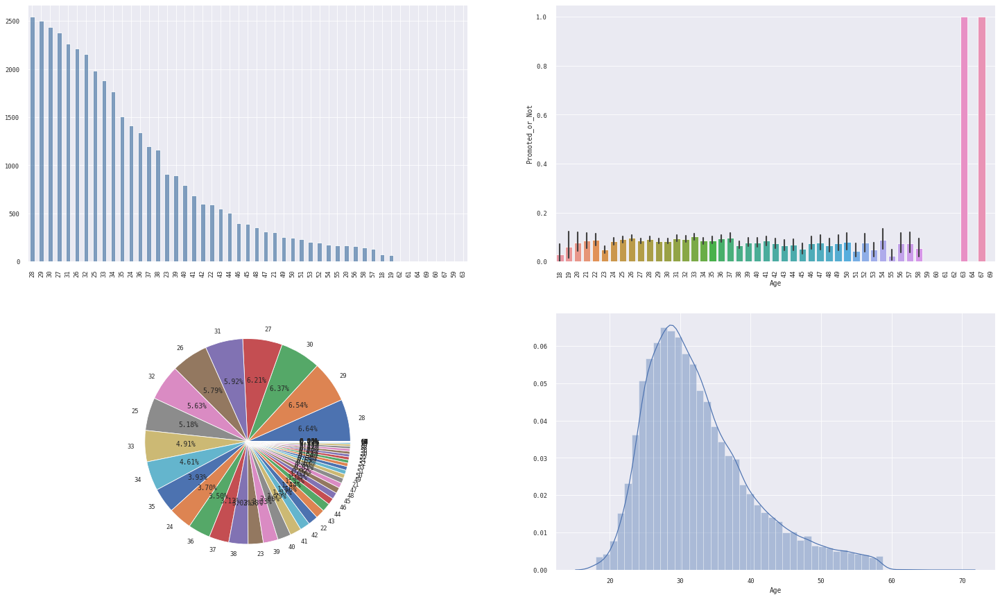

In [9]:
print('                                                                               AGE                                 ')
plt.figure(figsize=(25,15)) 
plt.subplot(2, 2, 1)
data_pro_feature['Age'].value_counts().plot('bar',color=(0.2, 0.4, 0.6, 0.6))
plt.subplot(2, 2, 2)
chart=sns.barplot(data_pro_feature['Age'], target)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
d=data_pro_feature['Age'].value_counts()
plt.subplot(2, 2, 3)
plt.pie(d,labels=d.index,autopct='%1.2f%%')
plt.subplot(2, 2, 4)
sns.distplot(data_pro_feature['Age']);
plt.show()

From the Age distributions, we see that most of the workers are around 30

In [20]:
pd.DataFrame(data_pro_feature['Age'].describe())

,Age
count,"38,312.0000"
mean,32.7907
std,7.6460
min,18.0000
25%,27.0000
50%,31.0000
75%,37.0000
max,69.0000


                                                                               Years_in_company                                 


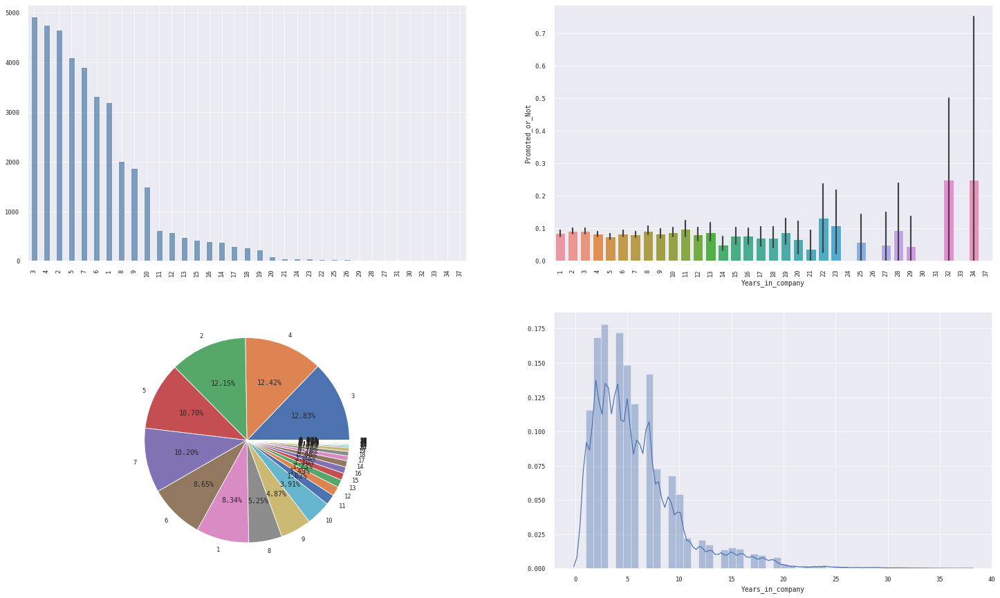

In [9]:
print('                                                                               Years_in_company                                 ')
plt.figure(figsize=(25,15)) 
plt.subplot(2, 2, 1)
data_pro_feature['Years_in_company'].value_counts().plot('bar',color=(0.2, 0.4, 0.6, 0.6))
plt.subplot(2, 2, 2)
chart=sns.barplot(data_pro_feature['Years_in_company'], target)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
d=data_pro_feature['Years_in_company'].value_counts()
plt.subplot(2, 2, 3)
plt.pie(d,labels=d.index,autopct='%1.2f%%')
plt.subplot(2, 2, 4)
sns.distplot(data_pro_feature['Years_in_company']);
plt.show()

In [12]:
pd.DataFrame(data_pro_feature['Years_in_company'].describe())

,Years_in_company
count,"38,312.0000"
mean,5.8603
std,4.2615
min,1.0000
25%,3.0000
50%,5.0000
75%,7.0000
max,37.0000


Box Plot for the features, Age and Years_in_company 


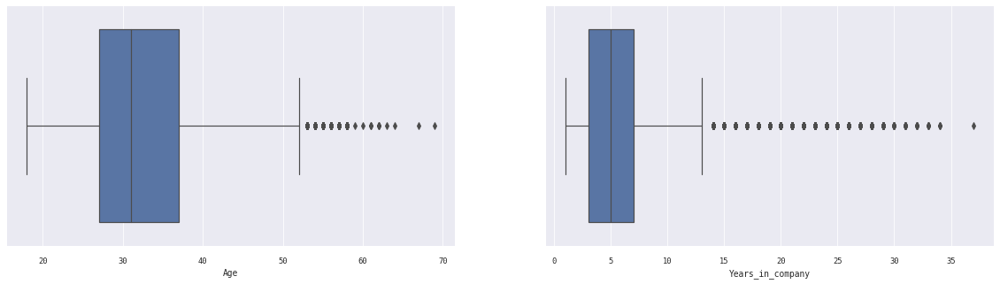

In [10]:
plt.figure(figsize=(20,5))
plt.subplot(1, 2, 1)
print('Box Plot for the features, Age and Years_in_company ')
box_age=sns.boxplot(data_pro_feature['Age'])
plt.subplot(1, 2, 2)
box_age=sns.boxplot(data_pro_feature['Years_in_company'])

### Feature Engineering: Converting 'Years_in_company' from Numerical to Categroical column

In [10]:
# The bin ranges for the bin groupings are taken from the stats of the 'Years_in_company'
binedges=[0,3,5,7,38]
binlabels=['entry-level','mid-level1','mid-level2','experienced']
data_pro_feature['cat_Years_in_company']=pd.cut(data_pro_feature['Years_in_company'],labels=binlabels,bins=binedges)
data_pro_feature.sample(5)

,EmployeeNo,Division,Qualification,Gender,Channel_of_Recruitment,Trainings_Attended,Age,Last_performance_score,Years_in_company,Targets_met,Previous_Award,Training_score_average,Foreign_schooled,Past_Disciplinary_Action,Previous_IntraDepartmental_Movement,No_of_previous_employers,Promoted_or_Not,cat_Years_in_company
34686,YAK/S/49541,Commercial Sales and Marketing,First Degree or HND,Male,Agency and others,2,53,10.0000,11,1,0,85,Yes,No,No,3,1,experienced
13803,YAK/S/19643,Commercial Sales and Marketing,First Degree or HND,Male,Direct Internal process,2,31,7.5000,7,0,0,40,Yes,No,Yes,0,0,mid-level2
2172,YAK/S/03021,Sourcing and Purchasing,First Degree or HND,Male,Direct Internal process,2,51,5.0000,4,0,0,64,Yes,No,No,0,0,mid-level1
1524,YAK/S/02107,Information Technology and Solution Support,First Degree or HND,Male,Agency and others,2,25,5.0000,2,0,0,72,Yes,No,Yes,1,0,entry-level
3341,YAK/S/04687,People/HR Management,First Degree or HND,Male,Agency and others,2,27,0.0000,1,0,0,40,No,No,No,1,0,entry-level


In [11]:
xx = data_pro_feature.groupby('cat_Years_in_company')['Promoted_or_Not'].value_counts().unstack(1)
per_not_promoted = xx.iloc[:, 0] *100/xx.apply(lambda x: x.sum(), axis=1)
per_promoted = xx.iloc[:, 1]*100/xx.apply(lambda x: x.sum(), axis=1)
xx['%_0'] = per_not_promoted
xx['%_1'] = per_promoted
display(xx)

Promoted_or_Not,0,1,%_0,%_1
cat_Years_in_company,,,,
entry-level,11617,1149,90.9995,9.0005
mid-level1,8151,707,92.0185,7.9815
mid-level2,6630,593,91.7901,8.2099
experienced,8673,792,91.6323,8.3677


### Feature Engineering: Converting 'Age' from Numerical to Categorical column

In [12]:
# Binning of age (ie conversion from muerical to categorical data)
# The bin ranges for the bin groupings are taken from the stats of the Ages
binedges=[17,27,31,37,70]
binlabels=['Young_Adult','Mid_Aged_Adult','Snr_Adult','Old_Fellow']
data_pro_feature['cat_Age']=pd.cut(data_pro_feature['Age'],bins=binedges,labels=binlabels)
data_pro_feature.sample(5)

,EmployeeNo,Division,Qualification,Gender,Channel_of_Recruitment,Trainings_Attended,Age,Last_performance_score,Years_in_company,Targets_met,Previous_Award,Training_score_average,Foreign_schooled,Past_Disciplinary_Action,Previous_IntraDepartmental_Movement,No_of_previous_employers,Promoted_or_Not,cat_Years_in_company,cat_Age
36243,YAK/S/51806,Commercial Sales and Marketing,First Degree or HND,Female,Agency and others,2,25,2.5000,5,0,0,41,Yes,No,No,1,0,mid-level1,Young_Adult
8104,YAK/S/11475,Commercial Sales and Marketing,First Degree or HND,Male,Agency and others,2,24,12.5000,2,0,0,41,Yes,No,No,1,0,entry-level,Young_Adult
22586,YAK/S/32230,Sourcing and Purchasing,"MSc, MBA and PhD",Male,Direct Internal process,2,32,7.5000,5,0,0,63,Yes,No,No,1,0,mid-level1,Snr_Adult
20444,YAK/S/29185,Customer Support and Field Operations,First Degree or HND,Male,Agency and others,2,28,10.0000,6,0,0,50,Yes,No,No,0,0,mid-level2,Mid_Aged_Adult
31602,YAK/S/45124,Information and Strategy,"MSc, MBA and PhD",Male,Agency and others,2,34,7.5000,5,1,0,74,No,No,No,0,0,mid-level1,Snr_Adult


In [13]:
xx = data_pro_feature.groupby('cat_Age')['Promoted_or_Not'].value_counts().unstack(1)
per_not_promoted = xx.iloc[:, 0] *100/xx.apply(lambda x: x.sum(), axis=1)
per_promoted = xx.iloc[:, 1]*100/xx.apply(lambda x: x.sum(), axis=1)
xx['%_0'] = per_not_promoted
xx['%_1'] = per_promoted
display(xx)

Promoted_or_Not,0,1,%_0,%_1
cat_Age,,,,
Young_Adult,9255,858,91.5159,8.4841
Mid_Aged_Adult,8894,865,91.1364,8.8636
Snr_Adult,8935,912,90.7383,9.2617
Old_Fellow,7987,606,92.9477,7.0523


### Feature Engineering: Categorizing 'Training_score_average' due to Multimodal distribution observed

,Training_score_average
count,"38,312.0000"
mean,55.3665
std,13.3627
min,31.0000
25%,43.0000
50%,52.0000
75%,68.0000
max,91.0000


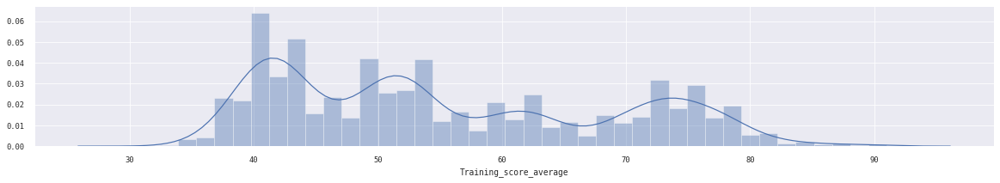

In [14]:
avg_train_score=sns.distplot(data_pro_feature['Training_score_average'])
display(pd.DataFrame(data_pro_feature['Training_score_average'].describe()))

In [15]:
# Feature Engineering:
# Binning on the basis of multimodal distplot indicating 4 different groups
binedges=[30,43,52,68,92]
binlabels=['low','avg','good','excellent']
data_pro_feature['cat_Training_score_average']=pd.cut(data_pro_feature['Training_score_average'],bins=binedges,labels=binlabels)
data_pro_feature.sample(5)

,EmployeeNo,Division,Qualification,Gender,Channel_of_Recruitment,Trainings_Attended,Age,Last_performance_score,Years_in_company,Targets_met,Previous_Award,Training_score_average,Foreign_schooled,Past_Disciplinary_Action,Previous_IntraDepartmental_Movement,No_of_previous_employers,Promoted_or_Not,cat_Years_in_company,cat_Age,cat_Training_score_average
4332,YAK/S/06095,Commercial Sales and Marketing,First Degree or HND,Male,Agency and others,2,35,2.5000,10,0,0,37,Yes,No,No,3,0,experienced,Snr_Adult,low
33504,YAK/S/47808,Sourcing and Purchasing,"MSc, MBA and PhD",Female,Agency and others,2,30,10.0000,6,0,0,62,Yes,No,No,1,0,mid-level2,Mid_Aged_Adult,good
5723,YAK/S/08075,Commercial Sales and Marketing,"MSc, MBA and PhD",Male,Agency and others,2,37,7.5000,9,0,0,54,Yes,No,Yes,1,1,experienced,Snr_Adult,good
27688,YAK/S/39505,Commercial Sales and Marketing,unknown,Male,Agency and others,2,53,7.5000,5,0,0,38,No,No,Yes,0,0,mid-level1,Old_Fellow,low
1469,YAK/S/02033,People/HR Management,"MSc, MBA and PhD",Male,Referral and Special candidates,2,34,7.5000,6,1,0,42,Yes,No,No,2,0,mid-level2,Snr_Adult,low


In [16]:
xx = data_pro_feature.groupby('cat_Age')['Promoted_or_Not'].value_counts().unstack(1)
per_not_promoted = xx.iloc[:, 0] *100/xx.apply(lambda x: x.sum(), axis=1)
per_promoted = xx.iloc[:, 1]*100/xx.apply(lambda x: x.sum(), axis=1)
xx['%_0'] = per_not_promoted
xx['%_1'] = per_promoted
display(xx)

Promoted_or_Not,0,1,%_0,%_1
cat_Age,,,,
Young_Adult,9255,858,91.5159,8.4841
Mid_Aged_Adult,8894,865,91.1364,8.8636
Snr_Adult,8935,912,90.7383,9.2617
Old_Fellow,7987,606,92.9477,7.0523


In [20]:
data_quality_report(data_pro_feature)

,Total,Percent,No_unique,Dtype
Age,0,0.0000,49,int64
Channel_of_Recruitment,0,0.0000,3,object
Division,0,0.0000,9,object
EmployeeNo,0,0.0000,38312,object
Foreign_schooled,0,0.0000,2,object
Gender,0,0.0000,2,object
Last_performance_score,0,0.0000,6,float64
No_of_previous_employers,0,0.0000,7,object
Past_Disciplinary_Action,0,0.0000,2,object
Previous_Award,0,0.0000,2,int64


In [21]:
data_pro_feature.sample(10)

,EmployeeNo,Division,Qualification,Gender,Channel_of_Recruitment,Trainings_Attended,Age,Last_performance_score,Years_in_company,Targets_met,Previous_Award,Training_score_average,Foreign_schooled,Past_Disciplinary_Action,Previous_IntraDepartmental_Movement,No_of_previous_employers,Promoted_or_Not,cat_Years_in_company,cat_Age,cat_Training_score_average
10570,YAK/S/14976,Information Technology and Solution Support,First Degree or HND,Male,Direct Internal process,2,25,0.0000,1,1,0,70,Yes,No,No,1,0,entry-level,Young_Adult,excellent
17457,YAK/S/24910,Regulatory and Legal services,"MSc, MBA and PhD",Male,Direct Internal process,2,45,7.5000,5,0,0,55,Yes,No,No,0,0,mid-level1,Old_Fellow,good
25418,YAK/S/36272,Commercial Sales and Marketing,"MSc, MBA and PhD",Male,Direct Internal process,2,31,5.0000,2,0,0,41,Yes,No,No,0,0,entry-level,Mid_Aged_Adult,low
7572,YAK/S/10716,Information Technology and Solution Support,unknown,Male,Agency and others,2,27,10.0000,2,0,0,68,Yes,No,No,1,0,entry-level,Young_Adult,good
7321,YAK/S/10376,Commercial Sales and Marketing,unknown,Male,Agency and others,2,31,10.0000,7,0,0,42,Yes,No,No,3,0,mid-level2,Mid_Aged_Adult,low
32506,YAK/S/46391,Customer Support and Field Operations,First Degree or HND,Male,Direct Internal process,2,26,7.5000,2,0,0,49,Yes,No,No,2,0,entry-level,Young_Adult,avg
11700,YAK/S/16634,Information Technology and Solution Support,First Degree or HND,Male,Direct Internal process,2,42,10.0000,4,1,0,73,Yes,No,No,1,0,mid-level1,Old_Fellow,excellent
32714,YAK/S/46695,Commercial Sales and Marketing,First Degree or HND,Male,Direct Internal process,2,23,12.5000,3,0,0,41,Yes,No,No,1,0,entry-level,Young_Adult,low
6849,YAK/S/09706,Information Technology and Solution Support,"MSc, MBA and PhD",Male,Direct Internal process,2,41,7.5000,12,0,0,74,Yes,No,No,1,0,experienced,Old_Fellow,excellent
34020,YAK/S/48549,Customer Support and Field Operations,First Degree or HND,Male,Agency and others,3,37,5.0000,8,0,0,52,Yes,No,No,0,0,experienced,Snr_Adult,avg


## Encoding Categorical features

In [17]:
data_pro_feature_encoded=encode_cat_features(data_pro_feature.drop(['EmployeeNo'],axis=1))
data_pro_feature_encoded.sample(5)

,Qualification,Trainings_Attended,Age,Last_performance_score,Years_in_company,Targets_met,Previous_Award,Training_score_average,Promoted_or_Not,cat_Years_in_company,cat_Age,cat_Training_score_average,Division_Business Finance Operations,Division_Commercial Sales and Marketing,Division_Customer Support and Field Operations,Division_Information Technology and Solution Support,Division_Information and Strategy,Division_People/HR Management,Division_Regulatory and Legal services,Division_Research and Innovation,Division_Sourcing and Purchasing,Gender_Female,Gender_Male,Channel_of_Recruitment_Agency and others,Channel_of_Recruitment_Direct Internal process,Channel_of_Recruitment_Referral and Special candidates,Foreign_schooled_No,Foreign_schooled_Yes,Past_Disciplinary_Action_No,Past_Disciplinary_Action_Yes,Previous_IntraDepartmental_Movement_No,Previous_IntraDepartmental_Movement_Yes,No_of_previous_employers_0,No_of_previous_employers_1,No_of_previous_employers_2,No_of_previous_employers_3,No_of_previous_employers_4,No_of_previous_employers_5,No_of_previous_employers_More than 5
4829,2,2,25,0.0000,1,1,0,53,1,1,1,3,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0
14825,2,3,53,12.5000,19,0,0,57,0,4,4,3,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,1,0,1,0,0,1,0,0,0,0,0
35234,2,2,24,0.0000,1,0,0,64,0,1,1,3,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1
37263,1,2,34,7.5000,10,1,0,55,0,4,3,3,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0
17346,2,3,24,0.0000,1,0,0,66,0,1,1,3,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,1,0,1,0,0,1,0,0,0,0,0


# Question 3
- Check for class imbalance in the dataset. Are they imbalance?    
- What is the percentage of the minority class to the majority class.   
- How did you solve the imbalance class problem?    
- What metric would you use for test evaluation.

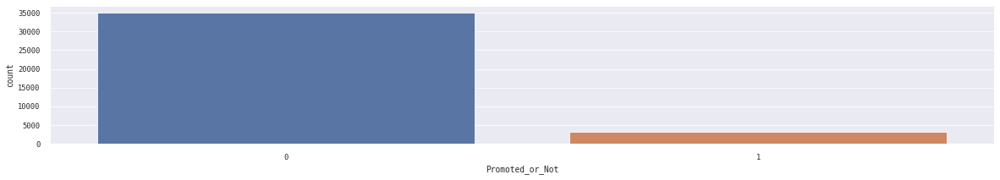

,Promoted_or_Not
0,91.5405
1,8.4595


In [18]:
# Checking whether target variable is balanced or not
sns.countplot(target)
plt.show()
pd.DataFrame(target.value_counts(normalize=True)*100)

- We can also create a 2-dimensional plot to see the data distribution.  
- Because the dataset has many dimensions (features) and our graphs will be 2D, we will reduce the size of the dataset using Principal Component Analysis (PCA):

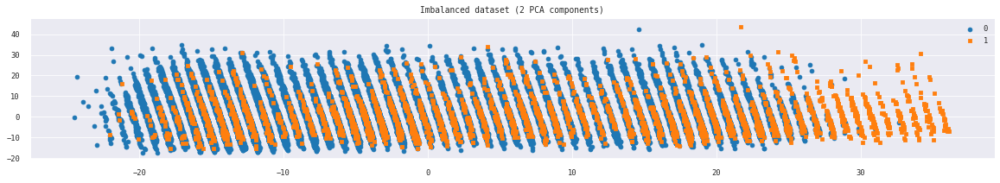

In [19]:
from sklearn.decomposition import PCA
# Separate input features and target
y = target   
X = data_pro_feature_encoded.drop(['Promoted_or_Not'], axis=1)

pca = PCA(n_components=2)
X = pca.fit_transform(X)

plot_2d_space(X, y, 'Imbalanced dataset (2 PCA components)')


## - The Data is highly imbalanced with only 8.4595% classified as Promoted
## - The perventage of the minority class to the majority class is 8.4595 to 91.5405 respectively

# Dealing with Imbalanced Data

## The metric trap 
we can use the DummyClassifier to always predict “not promoted” just to show how misleading accuracy can be.  
This informs looking at other metrics

In [20]:
from sklearn.dummy import DummyClassifier


# Separate input features and target
y = target   
X = data_pro_feature_encoded.drop(['Promoted_or_Not'], axis=1)

# setting up testing and training sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# DummyClassifier to predict only target 0
dummy = DummyClassifier(strategy='most_frequent').fit(X_train, y_train)
dummy_pred = dummy.predict(X_test)

# checking unique labels
print('Unique predicted labels: ', (np.unique(dummy_pred)))

# checking accuracy
accuracy =  accuracy_score(y_test, dummy_pred)

print('Test score: %.2f%% '  % (accuracy * 100.0))


Unique predicted labels:  [0]
Test score: 91.30% 


## Trying with logistic regression 

Test score: 92.63% 
Confusion matrix:
 [[6965   31]
 [ 534  133]]
              precision    recall  f1-score   support

           0       0.93      1.00      0.96      6996
           1       0.81      0.20      0.32       667

    accuracy                           0.93      7663
   macro avg       0.87      0.60      0.64      7663
weighted avg       0.92      0.93      0.91      7663



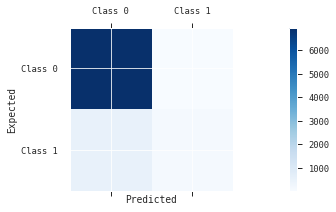

In [21]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

lr = LogisticRegression(solver='liblinear').fit(X_train, y_train)
 
# Predict on training set
lr_pred = lr.predict(X_test)

# checking accuracy
accuracy =accuracy_score(y_test, lr_pred)
print('Test score: %.2f%% '  % (accuracy * 100.0))

# Checking unique values
predictions = pd.DataFrame(lr_pred)
predictions[0].value_counts()


conf_mat = confusion_matrix(y_true=y_test, y_pred=lr_pred)
print('Confusion matrix:\n', conf_mat)
print(classification_report(y_true=y_test, y_pred=lr_pred))

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()


Using a trained classfier yielded a good predictions even when the model isn't trained. This isn't practical, hence high ccuracy rate could be illusional. In this way, the choice of the metric used in unbalanced datasets is extremely important.

## Changing the performance metric

### Confusion matrix 
An interesting way to evaluate the results is by means of a confusion matrix, which shows the correct and incorrect predictions for each class. In the first row, the first column indicates how many classes 0 were predicted correctly, and the second column, how many classes 0 were predicted as 1. In the second row, we note that all class 1 entries were erroneously predicted as class 0.

Therefore, the higher the diagonal values of the confusion matrix the better, indicating many correct predictions.

Confusion matrix:
 [[6996    0]
 [ 667    0]]
Test score: 91.30% 
              precision    recall  f1-score   support

           0       0.91      1.00      0.95      6996
           1       0.00      0.00      0.00       667

    accuracy                           0.91      7663
   macro avg       0.46      0.50      0.48      7663
weighted avg       0.83      0.91      0.87      7663



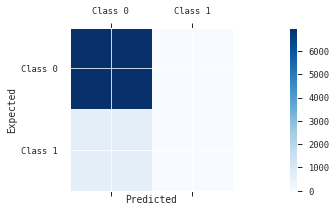

In [22]:
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 
from matplotlib import pyplot as plt

conf_mat = confusion_matrix(y_test, dummy_pred)
print('Confusion matrix:\n', conf_mat)

# checking accuracy
accuracy =accuracy_score(y_test, dummy_pred)
print('Test score: %.2f%% '  % (accuracy * 100.0))

print(classification_report(y_test, dummy_pred))

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()

## In trying to solve the imbalnced data problem, I considered different performance metrics including; precision, recall and f1-score, instead of just accuracy score. And the recall and f1-score seemed to perform better on this dataset.

# Resampling Techniques
A widely adopted technique for dealing with highly unbalanced datasets is called resampling. It consists of removing samples from the majority class (under-sampling) and / or adding more examples from the minority class (over-sampling).
Despite the advantage of balancing classes, these techniques also have their weaknesses. The simplest implementation of over-sampling is to duplicate random records from the minority class, which can cause overfitting. In under-sampling, the simplest technique involves removing random records from the majority class, which can cause loss of information.


![Over sampling and under sampling](img.png)

<cite data-cite="resamping">(https://www.kaggle.com/rafjaa/resampling-strategies-for-imbalanced-datasets)</cite>

In [35]:
#td.columns.duplicated()
#td.T.drop_duplicates().T
len(td[td.Promoted_or_Not==1])

2574

## Undersample majority class (Random under-sampling)

1    2574
0    2574
Name: Promoted_or_Not, dtype: int64

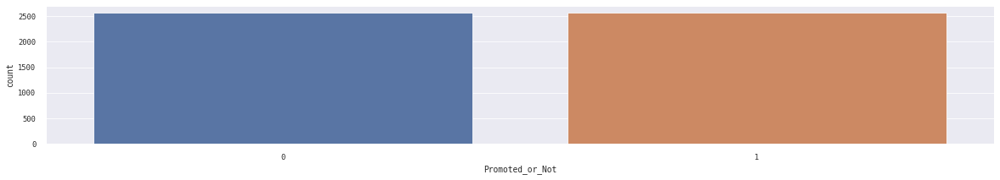

,Promoted_or_Not
1,50.0000
0,50.0000


In [23]:
from sklearn.utils import resample

# concatenate our training data back together
td = pd.concat([X_train, y_train], axis=1)

#separate minority and majority classes
not_promoted = td[td.Promoted_or_Not==0]
promoted = td[td.Promoted_or_Not==1]

# downsample majorityFirst Degree or First Degree or HNDFirst Degree or HNDFirst Degree or HNDFirst Degree or HNDHND
not_promoted_downsampled = resample(not_promoted,
                                replace = False, # sample without replacement
                                n_samples = len(promoted), # match minority n
                                random_state = 42) # reproducible results

# combine minority and downsampled majority
downsampled = pd.concat([not_promoted_downsampled, promoted])

# checking counts
display(downsampled.Promoted_or_Not.value_counts())

# Checking whether target variable is balanced or not
sns.countplot(downsampled.Promoted_or_Not)
plt.show()
pd.DataFrame(downsampled.Promoted_or_Not.value_counts(normalize=True)*100)

### Logistic Regressioin after downsampling

Test score: 78.64% 
Confusion matrix:
 [[389 134]
 [ 86 421]]
              precision    recall  f1-score   support

           0       0.82      0.74      0.78       523
           1       0.76      0.83      0.79       507

    accuracy                           0.79      1030
   macro avg       0.79      0.79      0.79      1030
weighted avg       0.79      0.79      0.79      1030



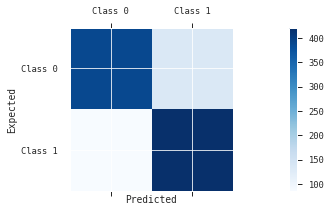

In [27]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

yds = downsampled['Promoted_or_Not']   
Xds =downsampled.drop(['Promoted_or_Not'], axis=1)


Xds_train, Xds_test, yds_train, yds_test = train_test_split(Xds, yds, test_size=0.20, random_state=42)
# Train model
lrds = LogisticRegression(solver='liblinear').fit(Xds_train, yds_train)
 
# Predict on training set
lrds_pred = lrds.predict(Xds_test)

# checking accuracy
accuracy =accuracy_score(yds_test, lrds_pred)
print('Test score: %.2f%% '  % (accuracy * 100.0))

# Checking unique values
predictions_ds = pd.DataFrame(lrds_pred)
predictions_ds[0].value_counts()


conf_mat_ds = confusion_matrix(y_true=yds_test, y_pred=lrds_pred)
print('Confusion matrix:\n', conf_mat_ds)
print(classification_report(y_true=yds_test, y_pred=lrds_pred))

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat_ds, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()



## Oversample minority class (Random over-sampling)

1    28075
0    28075
Name: Promoted_or_Not, dtype: int64

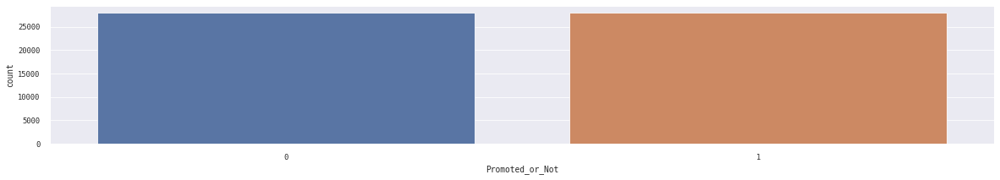

,Promoted_or_Not
1,50.0000
0,50.0000


In [25]:
from sklearn.utils import resample

# upsample minority
promoted_upsampled = resample(promoted,
                          replace=True, # sample with replacement
                          n_samples=len(not_promoted), # match number in majority class
                          random_state=42) # reproducible results

# combine majority and upsampled minority
upsampled = pd.concat([not_promoted, promoted_upsampled])

# checking counts
display(upsampled.Promoted_or_Not.value_counts())

# Checking whether target variable is balanced or not
sns.countplot(upsampled.Promoted_or_Not)
plt.show()
pd.DataFrame(upsampled.Promoted_or_Not.value_counts(normalize=True)*100)

### Logistic Regressioin after upsampling

Test score: 78.50% 
Confusion matrix:
 [[389 134]
 [ 86 421]]
              precision    recall  f1-score   support

           0       0.81      0.75      0.78      5583
           1       0.77      0.82      0.79      5647

    accuracy                           0.79     11230
   macro avg       0.79      0.78      0.78     11230
weighted avg       0.79      0.79      0.78     11230



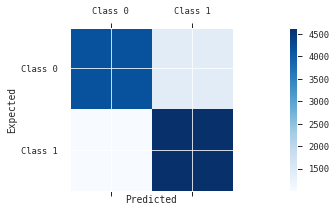

In [29]:
from sklearn.linear_model import LogisticRegression

yus = upsampled['Promoted_or_Not']   
Xus =upsampled.drop(['Promoted_or_Not'], axis=1)


Xus_train, Xus_test, yus_train, yus_test = train_test_split(Xus, yus, test_size=0.20, random_state=42)
# Train model
lrus = LogisticRegression(solver='liblinear').fit(Xus_train, yus_train)
 
# Predict on training set
lrus_pred = lrus.predict(Xus_test)

# checking accuracy
accuracy =accuracy_score(yus_test, lrus_pred)
print('Test score: %.2f%% '  % (accuracy * 100.0))

# Checking unique values
predictions_us = pd.DataFrame(lrus_pred)
predictions_us[0].value_counts()


conf_mat_us = confusion_matrix(y_true=yus_test, y_pred=lrus_pred)
print('Confusion matrix:\n', conf_mat_ds)
print(classification_report(y_true=yus_test, y_pred=lrus_pred))

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat_us, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()



Without even training the model, we got an accuray score of 91.30%, and that is delusional  
Now Let’s compare this to an actual trained classifiers like the XGBClassifier or the logistic regression and their performance

# Question 4
- Take the data given and split it into 80% train set and 20% test set. Use random seed = 42.
- Train a Binary Logistic Regression, Decision Tree Classifier, Random Forest Classifier, a Support Vector Machine Classifier and an xgBoost classifier on the training   data.
- What parameters and hyperparameters did you use for this model?
- Use a 5 fold Cross Validation to tune your model.

- The data is already splited
- X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)


## Building a Logistic Regression model

 

Test score: 78.64% 
Confusion matrix:
 [[389 134]
 [ 86 421]]
              precision    recall  f1-score   support

           0       0.82      0.74      0.78       523
           1       0.76      0.83      0.79       507

    accuracy                           0.79      1030
   macro avg       0.79      0.79      0.79      1030
weighted avg       0.79      0.79      0.79      1030



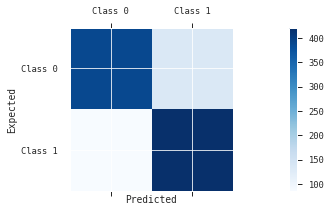

In [31]:
## Using LogisticRegression
from sklearn.linear_model import LogisticRegression

yds = downsampled['Promoted_or_Not']   
Xds =downsampled.drop(['Promoted_or_Not'], axis=1)


# Modeling the data as is
# Train model
lr = LogisticRegression(solver='liblinear').fit(Xds_train, yds_train)
 
# Predict on training set
lr_pred = lr.predict(Xds_test)

# checking accuracy
accuracy =accuracy_score(yds_test, lr_pred)
print('Test score: %.2f%% '  % (accuracy * 100.0))



# Checking unique values
predictions = pd.DataFrame(lr_pred)
predictions[0].value_counts()


conf_mat = confusion_matrix(y_true=yds_test, y_pred=lr_pred)
print('Confusion matrix:\n', conf_mat)
print(classification_report(y_true=yds_test, y_pred=lr_pred))

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()


## Building Decision Tree Classifier

Test score: 76.31% 
Confusion matrix:
 [[394 129]
 [115 392]]
              precision    recall  f1-score   support

           0       0.77      0.75      0.76       523
           1       0.75      0.77      0.76       507

    accuracy                           0.76      1030
   macro avg       0.76      0.76      0.76      1030
weighted avg       0.76      0.76      0.76      1030



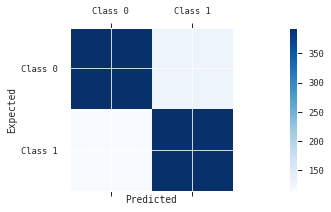

In [36]:
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier # Create Decision Tree classifer object

clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(Xds_train,yds_train)

#Predict the response for test dataset
ydt_pred = clf.predict(Xds_test)

# checking accuracy
accuracy =accuracy_score(yds_test,ydt_pred)
print('Test score: %.2f%% '  % (accuracy * 100.0))

conf_mat = confusion_matrix(y_true=yds_test, y_pred=ydt_pred)
print('Confusion matrix:\n', conf_mat)
print(classification_report(y_true=yds_test, y_pred=ydt_pred))

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()


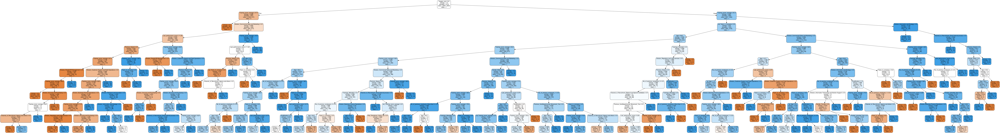

In [38]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = Xds_train.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('stafpromo.png')
Image(graph.create_png())

## Optimizing Decision Tree Performance

Test score: 78.45% 
Confusion matrix:
 [[364 159]
 [ 63 444]]
              precision    recall  f1-score   support

           0       0.85      0.70      0.77       523
           1       0.74      0.88      0.80       507

    accuracy                           0.78      1030
   macro avg       0.79      0.79      0.78      1030
weighted avg       0.80      0.78      0.78      1030



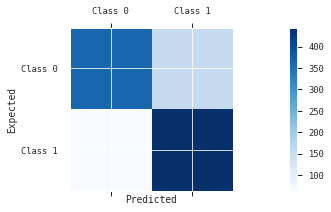

Decision Tree


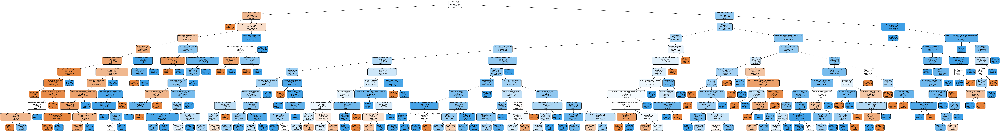

In [39]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=11)

# Train Decision Tree Classifer
clf = clf.fit(Xds_train,yds_train)

#Predict the response for test dataset
ydt_pred = clf.predict(Xds_test)

# checking accuracy
accuracy =accuracy_score(yds_test,ydt_pred)
print('Test score: %.2f%% '  % (accuracy * 100.0))

conf_mat = confusion_matrix(y_true=yds_test, y_pred=ydt_pred)
print('Confusion matrix:\n', conf_mat)
print(classification_report(y_true=yds_test, y_pred=ydt_pred))

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = Xds_train.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('stafpromo11.png')
print('Decision Tree')
Image(graph.create_png())

## Random Forest Classifier

Test score: 77.18% 
Confusion matrix:
 [[365 158]
 [ 77 430]]
              precision    recall  f1-score   support

           0       0.83      0.70      0.76       523
           1       0.73      0.85      0.79       507

    accuracy                           0.77      1030
   macro avg       0.78      0.77      0.77      1030
weighted avg       0.78      0.77      0.77      1030



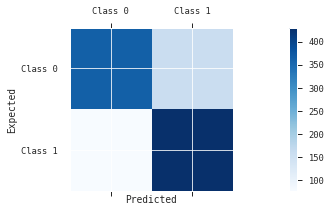

In [50]:
from sklearn.ensemble import RandomForestClassifier

# Create the model with 100 trees
model = RandomForestClassifier(n_estimators=1000, 
                               bootstrap = True,
                               max_features = 'sqrt')
# Fit on training data
model.fit(Xds_train, yds_train)

# Actual class predictions
rf_predictions = model.predict(Xds_test)
# Probabilities for each class
rf_probs = model.predict_proba(Xds_test)[:, 1]

# checking accuracy
accuracy =accuracy_score(yds_test,rf_predictions)
print('Test score: %.2f%% '  % (accuracy * 100.0))

conf_mat = confusion_matrix(y_true=yds_test, y_pred=rf_predictions)
print('Confusion matrix:\n', conf_mat)
print(classification_report(y_true=yds_test, y_pred=rf_predictions))

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()

dot_data = StringIO()
export_graphviz(model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = Xds_train.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('randomforest.png')
print('Decision Tree')
Image(graph.create_png())

## Support Vector Machine Classifier  

Accuracy score: 79.81% 
Confusion matrix:
 [[357 166]
 [ 42 465]]
              precision    recall  f1-score   support

           0       0.89      0.68      0.77       523
           1       0.74      0.92      0.82       507

    accuracy                           0.80      1030
   macro avg       0.82      0.80      0.80      1030
weighted avg       0.82      0.80      0.80      1030



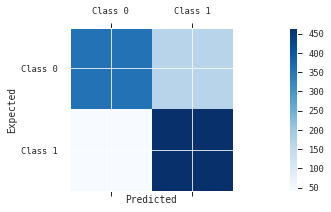

In [40]:
from sklearn.svm import SVC
svclassifier = SVC(kernel='linear')
svclassifier.fit(Xds_train, yds_train)

ysvm_pred = svclassifier.predict(Xds_test)

# checking accuracy
accuracy =accuracy_score(yds_test,ysvm_pred)
print('Accuracy score: %.2f%% '  % (accuracy * 100.0))
#f1 = f1_score(yds_test, y_pred)
#print('f1 = ',f1)
conf_mat = confusion_matrix(y_true=yds_test, y_pred=ysvm_pred)
print('Confusion matrix:\n', conf_mat)
print(classification_report(y_true=yds_test, y_pred=ysvm_pred))

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()

# xgBoost classifier

Accuracy score: 79.03% 
Confusion matrix:
 [[354 169]
 [ 47 460]]
              precision    recall  f1-score   support

           0       0.88      0.68      0.77       523
           1       0.73      0.91      0.81       507

    accuracy                           0.79      1030
   macro avg       0.81      0.79      0.79      1030
weighted avg       0.81      0.79      0.79      1030



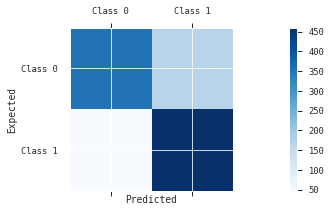

In [41]:
from xgboost import XGBClassifier

xgb_model = XGBClassifier()
xgb_model.fit(Xds_train, yds_train)
yxgb_pred = xgb_model.predict(Xds_test)

# checking accuracy
accuracy =accuracy_score(yds_test,yxgb_pred)
print('Accuracy score: %.2f%% '  % (accuracy * 100.0))
#f1 = f1_score(yds_test, y_pred)
#print('f1 = ',f1)
conf_mat = confusion_matrix(y_true=yds_test, y_pred=yxgb_pred)
print('Confusion matrix:\n', conf_mat)
print(classification_report(y_true=yds_test, y_pred=yxgb_pred))

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()

## Parameter tuning for xgb classifier

In [45]:
# Create parameters to search
params = {
     'learning_rate': [0.01],
     'n_estimators': [1000],
     'max_depth':[8],
     'reg_alpha':[0.4]
    }

# Initializing the XGBoost Regressor
xgb_model = xgb.XGBClassifier()

# Gridsearch initializaation
gsearch = GridSearchCV(xgb_model, params,
                    verbose=True,
                    cv=5,
                    n_jobs=3)

gsearch.fit(Xds_train, yds_train)

#Printing the best chosen params
print(gsearch.best_params_)

#params = {'objective':'binary:logistic', 'booster':'gbtree'}

# Updating the parameter as per grid search
params.update(gsearch.best_params_)

# Initializing the XGBoost Regressor
xgb_model = xgb.XGBClassifier(**params)
print(xgb_model)

# Cross validation scores
f1_scores = cross_val_score(xgb_model, Xds_train, yds_train, cv=5, scoring='f1',n_jobs=3)
print(f1_scores," Mean of f1_scores =  ",  np.mean(f1_scores))

# Fitting model on tuned parameters
xgb_model.fit( Xds_train, yds_train)

print('Confusion matrix:\n', conf_mat)
print(classification_report(y_true=yds_test, y_pred=y_pred))


#y_pred = xgb_model.predict(Xds_test.values)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done   5 out of   5 | elapsed:   40.6s finished


{'learning_rate': 0.01, 'max_depth': 8, 'n_estimators': 1000, 'reg_alpha': 0.4}
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.01, max_delta_step=0, max_depth=8,
              min_child_weight=1, missing=None, n_estimators=1000, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0.4, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)
[0.81105991 0.83056478 0.82539683 0.81413911 0.81715576]  Mean of f1_scores =   0.8196632768192181
Confusion matrix:
 [[354 169]
 [ 47 460]]
              precision    recall  f1-score   support

           0       0.88      0.68      0.77       523
           1       0.73      0.91      0.81       507

    accuracy                           0.79      1030
   macro avg       0.81      0.79      0.79      1030
weighted avg       0.81      0.79

In [47]:
###Hypertune the model intensively with a 5 fold cross validation strategy.
##first grid search for max_depth,min_child_weight then fix those and search for rest in same fashion
### parameter scale_pos_weight is quite important in case of imbalanced dataset

from sklearn.model_selection import GridSearchCV
param_test2b = {
  'min_child_weight':[5,6],
  'max_depth': range(3,10,2),
  'n_estimators':[150,200,300,400],
  'scale_pos_weight':[1,2,3,4],
  'colsample_bytree':[0.7,0.8], 
  'subsample':[0.7,0.8],
  'gamma':[0,0.2,0.4]
    
}
gsearch2b = GridSearchCV(estimator = XGBClassifier( learning_rate=0.1, n_estimators=150, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=3,seed=27), 
 param_grid = param_test2b, scoring='f1',n_jobs=4,iid=False, cv=5)
gsearch2b.fit(Xds_train, yds_train)
print(gsearch2b.cv_results_)
print("gsearch2b.best_params_",gsearch2b.best_params_)
print("gsearch2b.best_score_",gsearch2b.best_score_)

{'mean_fit_time': array([ 2.29370246,  2.34133139,  2.32533097, ..., 17.46064339,
       17.63195114, 15.23364534]), 'std_fit_time': array([0.2171896 , 0.07302258, 0.11359957, ..., 0.44292986, 0.52638014,
       2.48820142]), 'mean_score_time': array([0.02818127, 0.03056197, 0.02461557, ..., 0.08715744, 0.08501787,
       0.0638978 ]), 'std_score_time': array([0.00496362, 0.00411925, 0.00122719, ..., 0.00936862, 0.00516251,
       0.02278642]), 'param_colsample_bytree': masked_array(data=[0.7, 0.7, 0.7, ..., 0.8, 0.8, 0.8],
             mask=[False, False, False, ..., False, False, False],
       fill_value='?',
            dtype=object), 'param_gamma': masked_array(data=[0, 0, 0, ..., 0.4, 0.4, 0.4],
             mask=[False, False, False, ..., False, False, False],
       fill_value='?',
            dtype=object), 'param_max_depth': masked_array(data=[3, 3, 3, ..., 9, 9, 9],
             mask=[False, False, False, ..., False, False, False],
       fill_value='?',
            dtype=ob

Accuracy score: 80.87% 
Confusion matrix:
 [[348 175]
 [ 22 485]]
              precision    recall  f1-score   support

           0       0.94      0.67      0.78       523
           1       0.73      0.96      0.83       507

    accuracy                           0.81      1030
   macro avg       0.84      0.81      0.81      1030
weighted avg       0.84      0.81      0.80      1030



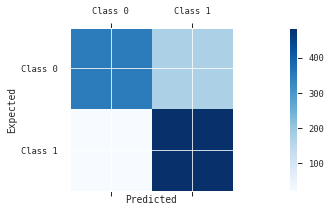

In [79]:
###Train the model with the best params
modelXg = XGBClassifier(learning_rate=0.1, n_estimators=200, max_depth=4, min_child_weight=7, 
                      gamma=0,nthread=4, subsample=0.8, colsample_bytree=0.7, objective= 'binary:logistic',scale_pos_weight=2,seed=29)
modelXg.fit(Xds_train, yds_train)
y_xg = modelXg.predict(Xds_test)

# checking accuracy
accuracy =accuracy_score(yds_test,y_xg)
print('Accuracy score: %.2f%% '  % (accuracy * 100.0))
#f1 = f1_score(yds_test, y_pred)
#print('f1 = ',f1)
conf_mat = confusion_matrix(y_true=yds_test, y_pred=y_xg)
print('Confusion matrix:\n', conf_mat)
print(classification_report(y_true=yds_test, y_pred=y_xg))

labels = ['Class 0', 'Class 1']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('Expected')
plt.show()

In [81]:
## Determine whether your model is overfitting or not , with the help of ROC.
print(confusion_matrix(yds_test, y_xg))
predictions = [value for value in y_xg]
accuracy = accuracy_score(yds_test, predictions)
precision = precision_score(yds_test, predictions)
recall = recall_score(yds_test, predictions)
f1 = f1_score(yds_test, predictions)
print("Accuracy_score: %.2f%% on test dataset" % (accuracy * 100.0))
print("precision_score: %.2f%% on test dataset" % (precision * 100.0))
print("recall_score: %.2f%% on test dataset" % (recall * 100.0))
print("f1_score: %.2f%% on test dataset" % (f1 * 100.0))
print("roc_auc test set", roc_auc_score(yds_test, modelXg.predict_proba(Xds_test)[:,1]))
print("roc_auc training set", roc_auc_score(yds_train, modelXg.predict_proba(Xds_train)[:,1]))

[[348 175]
 [ 22 485]]
Accuracy_score: 80.87% on test dataset
precision_score: 73.48% on test dataset
recall_score: 95.66% on test dataset
f1_score: 83.12% on test dataset
roc_auc test set 0.8785190884028948
roc_auc training set 0.9465027856424599


In [84]:
## Now the model is ready, and we can train the model on entire dataset.
modelXg = XGBClassifier(learning_rate=0.1, n_estimators=200, max_depth=4, min_child_weight=7, 
                      gamma=0,nthread=4, subsample=0.8, colsample_bytree=0.7, objective= 'binary:logistic',scale_pos_weight=2,seed=29)
modelXg.fit(X, y)



XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=4,
              min_child_weight=7, missing=None, n_estimators=200, n_jobs=1,
              nthread=4, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=2, seed=29,
              silent=None, subsample=0.8, verbosity=1)

# Question 5
- Present the Accuracy Score, Precision, Recall and Confusion Matrix for evaluating each model with the hold-out test data. 
- Plot the ROC Curve for the five models. 
- What’s the accuracy paradox and explain while the accuracy is not a suitable evaluation metric when you have an imbalanced class problem. 
- What other metrics can you use?


## - The Accuracy Score, Precision, Recall and Confusion Matrix for evaluating each model are correspondingly presented in the previous questions

## ROC Curve for the five models. 

In [54]:
#Plotting ROC Curve for the classifiers
from sklearn.metrics import roc_curve
log_fpr, log_tpr, log_thresold = roc_curve(yds_test, lr_pred)
dec_fpr, dec_tpr, dec_threshold = roc_curve(yds_test, ydt_pred)
ran_fpr, ran_tpr, ran_threshold = roc_curve(yds_test, rf_pridictions)
svc_fpr, svc_tpr, svc_threshold = roc_curve(yds_test, ysvm_pred)
xgb_fpr, xgb_tpr, tree_threshold = roc_curve(yds_test, y_xg)


def graph_roc_curve_multiple(log_fpr, log_tpr, dec_fpr, dec_tpr, ran_fpr, ran_tpr,svc_fpr, svc_tpr, xgb_fpr, xgb_tpr):
    plt.figure(figsize=(16,8))
    plt.title('ROC Curve \n Top 6 Classifiers', fontsize=20)
    plt.plot(log_fpr, log_tpr, label='Logistic Regression Classifier Score: {:.4f}'.format(roc_auc_score(yds_test, lr_pred)))
    plt.plot(dec_fpr, dec_tpr, label='Decision Tree Classifier Score: {:.4f}'.format(roc_auc_score(yds_test, ydt_pred)))
    plt.plot(ran_fpr, ran_tpr, label='Random Forest Classifier Score: {:.4f}'.format(roc_auc_score(yds_test, rf_pridictions)))
    plt.plot(svc_fpr, svc_tpr, label='Support Vector Machine Classifier Score: {:.4f}'.format(roc_auc_score(yds_test, ysvm_pred)))
    plt.plot(xgb_fpr, xgb_tpr, label='XGBoost Classifier Score: {:.4f}'.format(roc_auc_score(yds_test, y_xg)))
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([-0.01, 1, 0, 1])
    plt.xlabel('False Positive Rate', fontsize=20)
    plt.ylabel('True Positive Rate', fontsize=20)
    plt.annotate('Minimum ROC Score of 50% \n (This is the minimum score to get)', xy=(0.5, 0.5), xytext=(0.6, 0.3),
                arrowprops=dict(facecolor='#6E726D', shrink=0.05),
                )
    plt.legend()
    
graph_roc_curve_multiple(log_fpr, log_tpr,  dec_fpr, dec_tpr, ran_fpr, ran_tpr,svc_fpr, svc_tpr, xgb_fpr, xgb_tpr)
plt.show()

ValueError: continuous-multioutput format is not supported

##  The accuracy paradox

Accuracy Paradox for Predictive Analytics states that Predictive Models with a given level of Accuracy may have greater Predictive Power than Models with higher Accuracy.  

In our case, Random Forest Classifier with level of accuracy (78.25%)  may have greater predictive power (higher Recall(86) and f1-score(80)) than logistic regression with higher accuracy (78.64%) and (lower Recall(83) and f1-score(79))

# Question 6
- What are the feature importance generated from the classifiers above? 
- Create a scatter plot or bar chart for them. 
- Show a chart for the mean feature importance from the five models above. 
- Use a Maximum Hard Voting Ensemble Model of the five base models above to present a final model.




## Feature importance

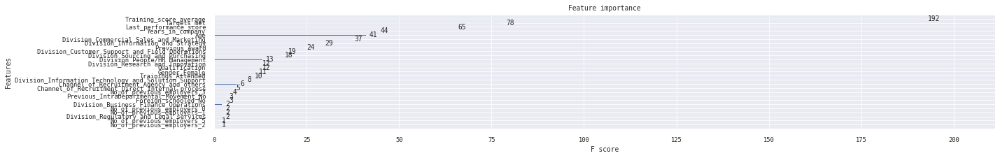

In [44]:


#Barplot of Feature Importance of XGBOOST Classifier
from xgboost import plot_importance
xgb=XGBClassifier()
xgb=xgb.fit(Xds_train,yds_train)
plot_importance(xgb)
plt.show()



In [51]:
#Maximum Hard Voting Ensemble Model 
from sklearn.ensemble import VotingClassifier
voting_clf = VotingClassifier(estimators = [('lr', lr), ('dec',clf), ('ran',model), ('svc',svclassifier), ('xgb',xgb_model)],voting = 'hard')
voting_clf.fit(Xds_train, yds_train)

VotingClassifier(estimators=[('lr',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=100,
                                                 multi_class='warn',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=None,
                                                 solver='liblinear', tol=0.0001,
                                                 verbose=0, warm_start=False)),
                             ('dec',
                              DecisionTreeClassifier(class_weight=None,
                                                     criterion='entropy',
                                                     max_de...
                                        

In [52]:
#Maximum Hard Voting Ensemble Model 
vt_clf = voting_clf.predict(Xds_test)

print('---' * 45)
print('Maximum Hard Voting Ensemble Model : \n')
print('Recall Score: {:.2f}'.format(recall_score(yds_test, vt_clf)))
print('Precision Score: {:.2f}'.format(precision_score(yds_test, vt_clf)))
print('F1 Score: {:.2f}'.format(f1_score(yds_test, vt_clf)))
print('Accuracy Score: {:.2f}'.format(accuracy_score(yds_test, vt_clf)))
print('Roc curve Score: {:.2f}'.format(roc_auc_score(yds_test, vt_clf)))
print('---' * 45)



---------------------------------------------------------------------------------------------------------------------------------------
Maximum Hard Voting Ensemble Model : 

Recall Score: 0.92
Precision Score: 0.74
F1 Score: 0.82
Accuracy Score: 0.80
Roc curve Score: 0.80
---------------------------------------------------------------------------------------------------------------------------------------
